# CS 1005 Project 
# Topic Education

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
import pandas as pd
import numpy as np
import io #data_extraction
import requests
import numpy as np # linear algebra
import seaborn as sns #statist graph package
import matplotlib.pyplot
import matplotlib.pyplot as plt #plot package
import pandasql as ps #sql package
import wordcloud # optional to the word cloud plot from wordcloud
from wordcloud import WordCloud,STOPWORDS # optional to filter out the stopwords

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
import glob
 
# specifying the path to csv files
path = "D:\EDUCATION"
 
# excel files in the path
file_list = glob.glob(path + "/*.xls")
 
# list of excel files we want to merge.
# pd.read_excel(file_path) reads the 
# excel data into pandas dataframe.
excl_list = []
 
for file in file_list:
    excl_list.append(pd.read_excel(file))
 
# concatenate all DataFrames in the list
# into a single DataFrame, returns new
# DataFrame.
data_merged = pd.concat(excl_list, ignore_index=True)


In [5]:
data_merged.shape

(8056, 71)

In [6]:
no_values={}

In [7]:
for item in data_merged.columns:
    no_values[item]=data_merged[item].isna().sum()

no_values

{'Publication Type': 0,
 'Authors': 1,
 'Book Authors': 8050,
 'Book Editors': 7497,
 'Book Group Authors': 7581,
 'Author Full Names': 1,
 'Book Author Full Names': 8050,
 'Group Authors': 7949,
 'Article Title': 0,
 'Source Title': 0,
 'Book Series Title': 7290,
 'Book Series Subtitle': 8056,
 'Language': 8056,
 'Document Type': 0,
 'Conference Title': 6967,
 'Conference Date': 6967,
 'Conference Location': 6967,
 'Conference Sponsor': 8056,
 'Conference Host': 7937,
 'Author Keywords': 1434,
 'Keywords Plus': 2172,
 'Abstract': 71,
 'Addresses': 18,
 'Affiliations': 8056,
 'Reprint Addresses': 42,
 'Email Addresses': 294,
 'Researcher Ids': 8056,
 'ORCIDs': 8056,
 'Funding Orgs': 8056,
 'Funding Name Preferred': 8056,
 'Funding Text': 8056,
 'Cited References': 8056,
 'Cited Reference Count': 0,
 'Times Cited, WoS Core': 0,
 'Times Cited, All Databases': 0,
 '180 Day Usage Count': 0,
 'Since 2013 Usage Count': 0,
 'Publisher': 8056,
 'Publisher City': 8056,
 'Publisher Address': 805

In [8]:
data_merged.dropna(how="all", axis=1, inplace=True)

In [9]:
data_merged.shape

(8056, 45)

In [10]:
data_merged.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

26       1
25       5
24      12
23     132
22     399
21     200
20     591
19    1720
18    2432
17    1304
16     776
15     319
14     127
13      35
12       3
dtype: int64

In [11]:
data_merged.drop_duplicates(inplace=True)

In [12]:
data_merged.shape

(8056, 45)

In [13]:
data_merged.isna().sum()

Publication Type                 0
Authors                          1
Book Authors                  8050
Book Editors                  7497
Book Group Authors            7581
Author Full Names                1
Book Author Full Names        8050
Group Authors                 7949
Article Title                    0
Source Title                     0
Book Series Title             7290
Document Type                    0
Conference Title              6967
Conference Date               6967
Conference Location           6967
Conference Host               7937
Author Keywords               1434
Keywords Plus                 2172
Abstract                        71
Addresses                       18
Reprint Addresses               42
Email Addresses                294
Cited Reference Count            0
Times Cited, WoS Core            0
Times Cited, All Databases       0
180 Day Usage Count              0
Since 2013 Usage Count           0
Publication Date              2360
Publication Year    

In [14]:
#df["Author Keywords"].unique()
data_merged['Publication Type'].unique()

array(['C', 'J', 'S'], dtype=object)

In [15]:
data_merged.columns

Index(['Publication Type', 'Authors', 'Book Authors', 'Book Editors',
       'Book Group Authors', 'Author Full Names', 'Book Author Full Names',
       'Group Authors', 'Article Title', 'Source Title', 'Book Series Title',
       'Document Type', 'Conference Title', 'Conference Date',
       'Conference Location', 'Conference Host', 'Author Keywords',
       'Keywords Plus', 'Abstract', 'Addresses', 'Reprint Addresses',
       'Email Addresses', 'Cited Reference Count', 'Times Cited, WoS Core',
       'Times Cited, All Databases', '180 Day Usage Count',
       'Since 2013 Usage Count', 'Publication Date', 'Publication Year',
       'Volume', 'Issue', 'Part Number', 'Supplement', 'Special Issue',
       'Meeting Abstract', 'Start Page', 'End Page', 'Article Number', 'DOI',
       'DOI Link', 'Book DOI', 'Early Access Date', 'WoS Categories',
       'Date of Export', 'UT (Unique WOS ID)'],
      dtype='object')

In [16]:
data_merged['Cited Reference Count'].value_counts()

40     168
50     153
42     151
39     151
30     146
33     144
47     143
36     142
38     141
34     141
44     141
43     137
37     136
48     135
49     135
32     135
41     131
35     130
26     129
46     129
31     129
23     128
27     127
53     126
28     125
45     122
25     119
52     118
29     118
22     105
51     104
24     103
55     100
21      98
58      98
60      94
56      94
54      93
15      90
20      90
17      87
19      87
61      82
18      79
59      78
57      77
16      75
63      73
71      65
66      63
69      61
62      60
70      60
65      57
64      57
74      55
68      55
67      54
72      53
14      52
11      51
13      50
79      49
73      47
12      46
10      43
75      43
77      40
0       39
9       34
76      34
81      33
87      33
78      33
8       31
80      31
88      29
86      29
84      29
7       28
83      28
82      27
85      27
5       26
89      25
90      24
101     23
92      22
100     21
6       20
94      20

In [17]:
data_merged.duplicated(subset=['Article Title']).any()

True

In [18]:
data_merged[data_merged.duplicated(subset=['Source Title'])==True]['Source Title']

14                 JOURNAL OF INTELLIGENT & FUZZY SYSTEMS
32                 JOURNAL OF INTELLIGENT & FUZZY SYSTEMS
36                 JOURNAL OF INTELLIGENT & FUZZY SYSTEMS
42      PROCEEDINGS OF THE 2021 IEEE GLOBAL ENGINEERIN...
43      PROCEEDINGS OF THE 2021 IEEE GLOBAL ENGINEERIN...
45      PROCEEDINGS OF THE 2021 IEEE GLOBAL ENGINEERIN...
53                                         SUSTAINABILITY
62      PROCEEDINGS OF THE 2021 IEEE GLOBAL ENGINEERIN...
77                                            IEEE ACCESS
78                               JMIR MEDICAL INFORMATICS
83            JOURNAL OF SCIENCE EDUCATION AND TECHNOLOGY
85      INTERNATIONAL JOURNAL OF EMERGING TECHNOLOGIES...
86                                     EDUCATION SCIENCES
88                            FOUNDATIONS OF DATA SCIENCE
89      2021 2ND INTERNATIONAL CONFERENCE ON E-COMMERC...
93       JOURNAL OF STATISTICS AND DATA SCIENCE EDUCATION
95                 EDUCATION AND INFORMATION TECHNOLOGIES
97      PROCEE

In [19]:
#data_merged.drop_duplicates(subset=['Source Title'],keep=False, inplace=True)

In [20]:
data_merged.shape

(8056, 45)

In [21]:
data_merged.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

26       1
25       5
24      12
23     132
22     399
21     200
20     591
19    1720
18    2432
17    1304
16     776
15     319
14     127
13      35
12       3
dtype: int64

In [22]:
data_merged['Publication Type'].value_counts().sort_values(ascending=False)

J    7008
C    1040
S       8
Name: Publication Type, dtype: int64

In [23]:
# which journal were preferred to publish mor than one time
l=[]
for val,index in zip(data_merged['Source Title'].value_counts(),data_merged['Source Title'].value_counts().index):
    if val>1:
        l.append(data_merged[data_merged['Source Title']==index].index)
l

[Int64Index([   8,   77,  100,  104,  141,  200,  293,  310,  380,  393,
             ...
             7197, 7200, 7217, 7221, 7228, 7319, 7341, 7483, 7679, 7753],
            dtype='int64', length=248),
 Int64Index([ 145,  197,  215,  221,  274,  304,  314,  319,  430,  605,
             ...
             7039, 7043, 7156, 7188, 7331, 7333, 7366, 7394, 7715, 7982],
            dtype='int64', length=141),
 Int64Index([ 205,  209,  250,  287,  292,  312,  317,  337,  345,  363,
             ...
             6595, 6678, 6680, 6759, 6905, 6926, 7155, 7354, 7375, 7963],
            dtype='int64', length=125),
 Int64Index([ 765,  976, 1152, 1201, 1205, 1300, 1302, 1392, 1399, 1400,
             ...
             7274, 7283, 7490, 7513, 7633, 7904, 7992, 8008, 8024, 8038],
            dtype='int64', length=113),
 Int64Index([2291, 2314, 2580, 2582, 2783, 3831, 3913, 3967, 3968, 4047, 7305,
             7323, 7324, 7336, 7343, 7344, 7346, 7353, 7355, 7368, 7369, 7374,
             7376, 7378, 7

<Figure size 1080x1080 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

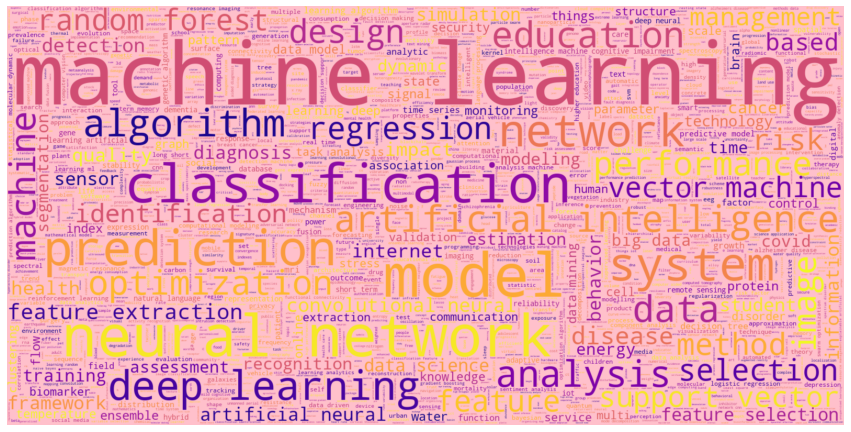

In [24]:
import matplotlib.pyplot as plt #plot package
import pandasql as ps #sql package
import wordcloud #will use for the word cloud plot
from wordcloud import WordCloud, STOPWORDS # optional to filter out the stopwords
#To build a wordcloud, we have to remove NULL values first:
aff_withoutna= (data_merged['Author Keywords']+data_merged['Keywords Plus']).fillna(value="")
word_string=" ".join(aff_withoutna.str.lower())
#Plot:
plt.figure(figsize=(15,15))
wc = WordCloud(background_color="pink", stopwords = STOPWORDS, max_words=2000, max_font_size= 300,  width=1600, height=800)
wc.generate(word_string)
plt.imshow(wc.recolor( colormap= 'plasma' , random_state=17), interpolation="bilinear")
plt.axis('off')

In [25]:
data_merged_reindex=data_merged.set_index(['Document Type','Source Title'])
data_merged_reindex.sample(6)
data_merged_reindex.shape

Publication Type  \
Document Type     Source Title                                                          
Article           IEEE GEOSCIENCE AND REMOTE SENSING LETTERS                        J   
                  IEEE TRANSACTIONS ON PATTERN ANALYSIS AND MACHI...                J   
Proceedings Paper MACHINE LEARNING AND KNOWLEDGE DISCOVERY IN DAT...                C   
Article           ADVANCED SCIENCE                                                  J   
Proceedings Paper 2021 IEEE 3RD GLOBAL CONFERENCE ON LIFE SCIENCE...                C   
                  PROCEEDINGS OF THE 23RD INTERNATIONAL CONFERENC...                C   

                                                                                                                Authors  \
Document Type     Source Title                                                                                            
Article           IEEE GEOSCIENCE AND REMOTE SENSING LETTERS          Qiu, CP; Liebel, L; Hughes, LH; Schmitt, M; Ko...   
                  IEEE TRANSACTIONS ON PATTERN ANALYSIS AND MACHI...  Liu, YY; Shang, FH; Liu, HY; Kong, L; Jiao, LC...   
Proceedings Paper MACHINE LEARNING AND KNOWLEDGE DISCOVERY IN DAT...                     Schreiber, J; Vogt, S; Sick, B   
Article           ADVANCED SCIENCE                                    Zhou, H; Li, DX; He, XM; Hui, XD; Guo, HY; Hu,...   
Proceedings Paper 2021 IEEE 3RD GLOBAL CONFERENCE ON LIFE SCIENCE...      Hayashi, K; Kumazoe, S; Ishida, S; Arakawa, Y   
                  PROCEEDINGS OF THE 23RD INTERNATIONAL CONFERENC...                      de Oliveira, WJB; Brandao, WC   

                                                                     Book Authors  \
Document Type     Source Title                                                      
Article           IEEE GEOSCIENCE AND REMOTE SENSING LETTERS                  NaN   
                  IEEE TRANSACTIONS ON PATTERN ANALYSIS AND MACHI...          NaN   
Proceedings Paper MACHINE LEARNING AND KNOWLEDGE DISCOVERY IN DAT...          NaN   
Article           ADVANCED SCIENCE                                            NaN   
Proceedings Paper 2021 IEEE 3RD GLOBAL CONFERENCE ON LIFE SCIENCE...          NaN   
                  PROCEEDINGS OF THE 23RD INTERNATIONAL CONFERENC...          NaN   

                                                                                                        Book Editors  \
Document Type     Source Title                                                                                         
Article           IEEE GEOSCIENCE AND REMOTE SENSING LETTERS                                                     NaN   
                  IEEE TRANSACTIONS ON PATTERN ANALYSIS AND MACHI...                                             NaN   
Proceedings Paper MACHINE LEARNING AND KNOWLEDGE DISCOVERY IN DAT...   Dong, Y; Kourtellis, N; Hammer, B; Lozano, JA   
Article           ADVANCED SCIENCE                                                                               NaN   
Proceedings Paper 2021 IEEE 3RD GLOBAL CONFERENCE ON LIFE SCIENCE...                                             NaN   
                  PROCEEDINGS OF THE 23RD INTERNATIONAL CONFERENC...  Filipe, J; Smialek, M; Brodsky, A; Hammoudi, S   

                                                                     Book Group Authors  \
Document Type     Source Title                                                            
Article           IEEE GEOSCIENCE AND REMOTE SENSING LETTERS                        NaN   
                  IEEE TRANSACTIONS ON PATTERN ANALYSIS AND MACHI...                NaN   
Proceedings Paper MACHINE LEARNING AND KNOWLEDGE DISCOVERY IN DAT...                NaN   
Article           ADVANCED SCIENCE                                                  NaN   
Proceedings Paper 2021 IEEE 3RD GLOBAL CONFERENCE ON LIFE SCIENCE...               IEEE   
                  PROCEEDINGS OF THE 23RD INTERNATIONAL CONFERENC...                NaN   



(8056, 43)

In [26]:
data_merged.describe()


,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Year,DOI Link
count,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,7512.000000,7735.0
mean,51.715119,2.131703,2.149206,5.420804,9.530164,2021.304446,0.0
std,40.123631,8.585780,8.748309,9.082664,16.744699,0.460781,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,2020.000000,0.0
25%,29.000000,0.000000,0.000000,1.000000,1.000000,2021.000000,0.0
50%,44.000000,0.000000,0.000000,3.000000,4.000000,2021.000000,0.0
75%,62.000000,2.000000,2.000000,7.000000,11.000000,2022.000000,0.0
max,815.000000,471.000000,488.000000,158.000000,295.000000,2023.000000,0.0


In [27]:
data_merged['Article Title'].value_counts()

Note from the Editor                                                                                                                                                                                                                                                                                                           3
When Optimization Meets Machine Learning: The Case of IRS-Assisted Wireless Networks                                                                                                                                                                                                                                           2
Celebrating Design Thinking in Tech Education: The Data Science Education Case                                                                                                                                                                                                                                                 1
Potency of individual identification 

In [28]:
check_null_val=data_merged.isnull().sum(axis=1).value_counts().sort_index(ascending=False)
df_null=pd.DataFrame(check_null_val, columns=['all'])
df_null

,all
26,1
25,5
24,12
23,132
22,399
21,200
20,591
19,1720
18,2432
17,1304


In [29]:
data_merged_g=data_merged.groupby('Publication Type')
data_merged_g.sample(6)

,Publication Type,Authors,Book Authors,Book Editors,Book Group Authors,Author Full Names,Book Author Full Names,Group Authors,Article Title,Source Title,Book Series Title,Document Type,Conference Title,Conference Date,Conference Location,Conference Host,Author Keywords,Keywords Plus,Abstract,Addresses,Reprint Addresses,Email Addresses,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Date,Publication Year,Volume,Issue,Part Number,Supplement,Special Issue,Meeting Abstract,Start Page,End Page,Article Number,DOI,DOI Link,Book DOI,Early Access Date,WoS Categories,Date of Export,UT (Unique WOS ID)
6394,C,"Sommer, L; Axenie, C; Koch, A",NaN,"Kamp, M; Koprinska, I; Bibal, A; Bouadi, T; Fr...",NaN,"Sommer, Lukas; Axenie, Cristian; Koch, Andreas",NaN,NaN,SPNC: Fast Sum-Product Network Inference,MACHINE LEARNING AND PRINCIPLES AND PRACTICE O...,Communications in Computer and Information Sci...,Proceedings Paper,21st Joint European Conference on Machine Lear...,"SEP 13-17, 2021",ELECTR NETWORK,NaN,Sum-Product Networks; Compiler; MLIR; LLVM,NaN,Sum-Product Networks have received increasing ...,"[Sommer, Lukas; Koch, Andreas] Tech Univ Darms...","Sommer, L (corresponding author), Tech Univ Da...",sommer@esa.tu-darmstadt.de; cristian.axenie@hu...,12,0,0,0,0,NaN,2021.0,1524,NaN,NaN,NaN,NaN,NaN,397,408,NaN,10.1007/978-3-030-93736-2_31,0.0,NaN,NaN,"Computer Science, Artificial Intelligence; Com...",2022-06-17,WOS:000773469200031
6347,C,"Schneider, S; Qarawlus, H; Karl, H",NaN,NaN,IEEE COMP SOC,"Schneider, Stefan; Qarawlus, Haydar; Karl, Holger",NaN,NaN,Distributed Online Service Coordination Using ...,2021 IEEE 41ST INTERNATIONAL CONFERENCE ON DIS...,IEEE International Conference on Distributed C...,Proceedings Paper,41st IEEE International Conference on Distribu...,"JUL 07-10, 2021",ELECTR NETWORK,NaN,NaN,NaN,Services often consist of multiple chained com...,"[Schneider, Stefan; Qarawlus, Haydar; Karl, Ho...","Schneider, S (corresponding author), Paderborn...",stefan.schneider@upb.de; haydar.qarawlus@isst....,51,0,0,1,1,NaN,2021.0,NaN,NaN,NaN,NaN,NaN,NaN,539,549,NaN,10.1109/ICDCS51616.2021.00058,0.0,NaN,NaN,"Computer Science, Hardware & Architecture; Com...",2022-06-17,WOS:000728379200049
2785,C,"Kashima, K; Watanabe, M; Maruta, I",NaN,NaN,NaN,"Kashima, Kenji; Watanabe, Moe; Maruta, Ichiro",NaN,NaN,Simultaneous Identification of Nonlinear Dynam...,IFAC PAPERSONLINE,NaN,Proceedings Paper,"3rd IFAC Conference on Modelling, Identificati...","SEP 15-17, 2021","Tokyo, JAPAN",NaN,Nonlinear system identification; generative mo...,NaN,"In this paper, we newly formulate and solve a ...","[Kashima, Kenji; Watanabe, Moe] Kyoto Univ, Gr...","Kashima, K (corresponding author), Kyoto Univ,...",kk@i.kyoto-u.ac.jp; watanabe.moe@bode.amp.i.ky...,26,0,0,0,0,NaN,2021.0,54,14,NaN,NaN,NaN,NaN,25,30,NaN,10.1016/j.ifacol.2021.10.323,0.0,NaN,NOV 2021,Automation & Control Systems,2022-06-17,WOS:000714395700005
3936,C,"de Biase, MS; Marulli, F; Verde, L; Marrone, S",NaN,NaN,IEEE,"de Biase, Maria Stella; Marulli, Fiammetta; Ve...",NaN,NaN,Improving Classification Trustworthiness in Ra...,PROCEEDINGS OF THE 2021 IEEE INTERNATIONAL CON...,NaN,Proceedings Paper,IEEE International Conference on Cyber Securit...,"JUL 26-28, 2021",ELECTR NETWORK,NaN,Random Forests; Classification Trustworthiness...,MODELS,Machine learning algorithms are becoming more ...,"[de Biase, Maria Stella; Marulli, Fiammetta; V...","de Biase, MS (corresponding author), Univ Camp...",mariastella.debiase@unicampania.it; fiammetta....,31,0,0,1,1,NaN,2021.0,NaN,NaN,NaN,NaN,NaN,NaN,563,568,NaN,10.1109/CSR51186.2021.9527939,0.0,NaN,NaN,"Computer Science, Information Systems; Compute...",2022-06-17,WOS:000705054100088
42,C,"Mike, K; Hartal, G; Hazzan, O",NaN,"Klinger, T; Kollmitzer, C; Pester, A",NaN,"Mike, Koby; Hartal, Gilly; Hazzan, Orit",NaN,NaN,Widening the Shrinking Pipeline: The Case of D...,PROCEEDINGS OF THE 2021 IEEE GL

In [30]:
data_merged['Document Type'].value_counts().sort_index(ascending=False)

Review; Early Access                   33
Review                                400
Retraction                              1
Proceedings Paper                    1040
News Item                               1
Meeting Abstract                       24
Letter                                  7
Editorial Material; Early Access        4
Editorial Material                     35
Correction                              7
Book Review; Early Access               1
Book Review                             1
Article; Proceedings Paper             35
Article; Early Access                 505
Article; Data Paper; Early Access       1
Article; Data Paper                    15
Article; Book Chapter                   4
Article                              5942
Name: Document Type, dtype: int64

In [31]:
data_merged.columns

Index(['Publication Type', 'Authors', 'Book Authors', 'Book Editors',
       'Book Group Authors', 'Author Full Names', 'Book Author Full Names',
       'Group Authors', 'Article Title', 'Source Title', 'Book Series Title',
       'Document Type', 'Conference Title', 'Conference Date',
       'Conference Location', 'Conference Host', 'Author Keywords',
       'Keywords Plus', 'Abstract', 'Addresses', 'Reprint Addresses',
       'Email Addresses', 'Cited Reference Count', 'Times Cited, WoS Core',
       'Times Cited, All Databases', '180 Day Usage Count',
       'Since 2013 Usage Count', 'Publication Date', 'Publication Year',
       'Volume', 'Issue', 'Part Number', 'Supplement', 'Special Issue',
       'Meeting Abstract', 'Start Page', 'End Page', 'Article Number', 'DOI',
       'DOI Link', 'Book DOI', 'Early Access Date', 'WoS Categories',
       'Date of Export', 'UT (Unique WOS ID)'],
      dtype='object')

In [32]:
data_merged_refine=data_merged[['Publication Type','Authors','Article Title', 'Source Title','Document Type','Cited Reference Count', 
                            'Times Cited, WoS Core','Times Cited, All Databases', '180 Day Usage Count',
       'Since 2013 Usage Count', 'Publication Date', 'Publication Year','DOI','WoS Categories','UT (Unique WOS ID)']]

In [33]:
data_merged_refine.sample(6)

,Publication Type,Authors,Article Title,Source Title,Document Type,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Date,Publication Year,DOI,WoS Categories,UT (Unique WOS ID)
4975,J,"Abdelali, HA; Derrouz, H; Zennayi, Y; Thami, R...",Multiple Hypothesis Detection and Tracking Usi...,IEEE ACCESS,Article,38,0,0,8,8,NaN,2021.0,10.1109/ACCESS.2021.3133529,"Computer Science, Information Systems; Enginee...",WOS:000731137600001
1250,J,"Shin, J; Maniruzzaman, M; Uchida, Y; Hasan, MA...",Important Features Selection and Classificatio...,APPLIED SCIENCES-BASEL,Article,35,0,0,0,0,MAY,2022.0,10.3390/app12105256,"Chemistry, Multidisciplinary; Engineering, Mul...",WOS:000804307300001
1207,J,"Luo, XY",Efficient English text classification using se...,ALEXANDRIA ENGINEERING JOURNAL,Article,40,16,16,7,19,JUN,2021.0,10.1016/j.aej.2021.02.009,"Engineering, Multidisciplinary",WOS:000634501400007
6785,J,"Lei, BY; Cheng, NN; Frangi, AF; Wei, YC; Yu, B...",Auto-weighted centralised multi-task learning ...,MEDICAL IMAGE ANALYSIS,Article,37,1,1,7,15,DEC,2021.0,10.1016/j.media.2021.102248,"Computer Science, Artificial Intelligence; Com...",WOS:000704125900003
1048,J,"Chakraborty, S; Aich, S; Kim, HC",A Novel Sleep Scoring Algorithm-Based Framewor...,INTERNATIONAL JOURNAL OF SYSTEM DYNAMICS APPLI...,Article,34,0,0,1,1,JUL-SEP,2021.0,10.4018/IJSDA.2021070101,"Computer Science, Artificial Intelligence",WOS:000654991500001
4362,J,"Panneerselvam, K; Ishikawa, S; Krishnan, R; Su...",Salivary Metabolomics for Oral Cancer Detectio...,METABOLITES,Review,98,0,0,0,0,MAY,2022.0,10.3390/metabo12050436,Biochemistry & Molecular Biology,WOS:000801526100001


In [34]:
data_merged_refine.shape

(8056, 15)

In [35]:
data_merged_refine.isna().sum()

Publication Type                 0
Authors                          1
Article Title                    0
Source Title                     0
Document Type                    0
Cited Reference Count            0
Times Cited, WoS Core            0
Times Cited, All Databases       0
180 Day Usage Count              0
Since 2013 Usage Count           0
Publication Date              2360
Publication Year               544
DOI                            321
WoS Categories                  21
UT (Unique WOS ID)               0
dtype: int64

In [36]:
data_merged_refine['Publication Year'].value_counts()

2021.0    5224
2022.0    2286
2023.0       1
2020.0       1
Name: Publication Year, dtype: int64

In [37]:
data_merged_refine.loc[data_merged_refine['Publication Year'].isna()]['Document Type'].value_counts() 

Article; Early Access                505
Review; Early Access                  33
Editorial Material; Early Access       4
Book Review; Early Access              1
Article; Data Paper; Early Access      1
Name: Document Type, dtype: int64

In [38]:
data_merged_refine['Document Type'].isna().sum()

0

In [39]:
data_merged_refine['Publication Year'].isna().sum()

544

In [40]:
data_merged_refine[data_merged_refine['Publication Year']==2022].isna().sum()

Publication Type                0
Authors                         0
Article Title                   0
Source Title                    0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Date              315
Publication Year                0
DOI                            35
WoS Categories                  3
UT (Unique WOS ID)              0
dtype: int64

In [41]:
data_merged_refine[data_merged_refine['Publication Year']==2021].isna().sum()

Publication Type                 0
Authors                          1
Article Title                    0
Source Title                     0
Document Type                    0
Cited Reference Count            0
Times Cited, WoS Core            0
Times Cited, All Databases       0
180 Day Usage Count              0
Since 2013 Usage Count           0
Publication Date              1501
Publication Year                 0
DOI                            286
WoS Categories                  18
UT (Unique WOS ID)               0
dtype: int64

In [42]:
data_merged_refine['Publication Date'].sample(6)
data_merged_refine['Publication Year'].sample(7)

4582       FEB
615        JAN
894        JUL
1392    SEP 21
4041       NaN
6189     APR 1
Name: Publication Date, dtype: object

3801    2021.0
5183    2021.0
6775    2022.0
3489    2021.0
1380    2022.0
7334    2021.0
5878    2021.0
Name: Publication Year, dtype: float64

In [43]:
data_merged_refine.drop(['Publication Date'],axis=1, inplace=True)

C:\Users\nknav\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [44]:
data_merged_refine.isna().sum()

Publication Type                0
Authors                         1
Article Title                   0
Source Title                    0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Year              544
DOI                           321
WoS Categories                 21
UT (Unique WOS ID)              0
dtype: int64

In [45]:
data_merged_refine['WoS Categories'].fillna(data_merged_refine['WoS Categories'].mode()[0],inplace=True)
data_merged_refine['WoS Categories'].sample(5)

C:\Users\nknav\anaconda3\lib\site-packages\pandas\core\generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


6761                    Education, Scientific Disciplines
6324    Computer Science, Information Systems; Enginee...
5638    Green & Sustainable Science & Technology; Envi...
5773                   Computer Science, Theory & Methods
6893    Computer Science, Information Systems; Enginee...
Name: WoS Categories, dtype: object

In [46]:
data_merged_refine.isna().sum()

Publication Type                0
Authors                         1
Article Title                   0
Source Title                    0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Year              544
DOI                           321
WoS Categories                  0
UT (Unique WOS ID)              0
dtype: int64

In [47]:
data_merged_refine['Publication Year'].dropna()
#data_merged_refine['Publication Year'] = np.where(data_merged_refine['180 Day Usage Count'] == '0', '2022', data_merged_refine['Publication Year'])

0       2021.0
1       2021.0
2       2022.0
3       2021.0
4       2021.0
5       2021.0
6       2021.0
7       2022.0
8       2021.0
10      2021.0
11      2021.0
12      2021.0
13      2021.0
14      2021.0
15      2022.0
16      2022.0
17      2022.0
18      2021.0
19      2022.0
20      2021.0
21      2021.0
22      2022.0
25      2021.0
26      2021.0
27      2021.0
28      2021.0
29      2021.0
30      2021.0
31      2022.0
32      2021.0
33      2021.0
34      2021.0
35      2021.0
36      2021.0
37      2021.0
38      2021.0
40      2021.0
41      2021.0
42      2021.0
43      2021.0
44      2021.0
45      2021.0
46      2021.0
47      2021.0
48      2021.0
49      2021.0
50      2021.0
51      2021.0
53      2022.0
54      2022.0
55      2021.0
56      2021.0
57      2021.0
58      2021.0
59      2022.0
60      2022.0
61      2021.0
62      2021.0
63      2021.0
64      2021.0
65      2021.0
67      2021.0
68      2021.0
70      2021.0
71      2021.0
72      2022.0
73      20

In [48]:
data_merged_refine['Publication Year'].value_counts()

2021.0    5224
2022.0    2286
2023.0       1
2020.0       1
Name: Publication Year, dtype: int64

In [199]:
data_merged_refine.isna().sum()

Publication Type                0
Authors                         1
Article Title                   0
Source Title                    0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Year              544
DOI                           321
WoS Categories                  0
UT (Unique WOS ID)              0
dtype: int64

In [50]:
data_merged_refine['Publication Year'].sample(6)

3179    2021.0
6072    2021.0
6450    2021.0
3965    2021.0
4008    2021.0
2549    2021.0
Name: Publication Year, dtype: float64

In [51]:
scopus=pd.read_excel("D:\EDUCATION\scopus_2022_CiteScore.xlsx")
scopus.head()

C:\Users\nknav\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,Source title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher
0,Ca-A Cancer Journal for Clinicians,716.2,99.0%\n1/360\nOncology,76632.0,107.0,91.0,173.932,56.204,Wiley-Blackwell
1,Nature Reviews Molecular Cell Biology,140.9,99.0%\n1/386\nMolecular Biology,28743.0,204.0,90.0,19.069,33.213,Springer Nature
2,The Lancet,115.3,99.0%\n1/826\nGeneral Medicine,198711.0,1723.0,76.0,33.801,15.652,Elsevier
3,New England Journal of Medicine,110.5,99.0%\n2/826\nGeneral Medicine,261485.0,2367.0,85.0,20.135,24.907,Massachusetts Medical Society
4,Reviews of Modern Physics,102.0,99.0%\n1/240\nGeneral Physics and Astronomy,14489.0,142.0,97.0,16.262,21.151,American Physical Society


In [52]:
scopus.shape

(1000, 9)

In [53]:
scopus.isna().sum()

Source title          0
CiteScore             0
Highest percentile    0
2018-21 Citations     0
2018-21 Documents     0
% Cited               0
SNIP                  9
SJR                   8
Publisher             0
dtype: int64

In [54]:
scopus['SNIP'].sample(6)

751    3.361
298    5.000
62     5.377
472    2.594
867    2.753
184    2.895
Name: SNIP, dtype: float64

In [55]:
scopus['SNIP'].fillna(scopus['SNIP'].mean(),inplace=True)
scopus['SNIP'].isna().sum()

0

In [56]:
scopus['SJR'].fillna(scopus['SJR'].mean(),inplace=True)
scopus['SJR'].isna().sum()

0

In [57]:
scopus.isna().sum()

Source title          0
CiteScore             0
Highest percentile    0
2018-21 Citations     0
2018-21 Documents     0
% Cited               0
SNIP                  0
SJR                   0
Publisher             0
dtype: int64

In [58]:
scopus['Category']=scopus['Highest percentile'].str.split('\n').str.get(2)
scopus.head()

,Source title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category
0,Ca-A Cancer Journal for Clinicians,716.2,99.0%\n1/360\nOncology,76632.0,107.0,91.0,173.932,56.204,Wiley-Blackwell,Oncology
1,Nature Reviews Molecular Cell Biology,140.9,99.0%\n1/386\nMolecular Biology,28743.0,204.0,90.0,19.069,33.213,Springer Nature,Molecular Biology
2,The Lancet,115.3,99.0%\n1/826\nGeneral Medicine,198711.0,1723.0,76.0,33.801,15.652,Elsevier,General Medicine
3,New England Journal of Medicine,110.5,99.0%\n2/826\nGeneral Medicine,261485.0,2367.0,85.0,20.135,24.907,Massachusetts Medical Society,General Medicine
4,Reviews of Modern Physics,102.0,99.0%\n1/240\nGeneral Physics and Astronomy,14489.0,142.0,97.0,16.262,21.151,American Physical Society,General Physics and Astronomy


In [59]:
scopus['Highest percentile']=scopus['Highest percentile'].astype(str).str.split('%').str.get(0).astype('float64')
scopus.sample(6)

,Source title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category
868,Geoscience Frontiers,11.8,97.0,7416.0,626.0,92.0,2.549,1.780,China University of Geosciences (Beijing) and ...,General Earth and Planetary Sciences
71,Nature Cell Biology,40.2,99.0,21862.0,544.0,90.0,4.502,9.897,Springer Nature,Cell Biology
277,Reviews in Physics,20.5,95.0,637.0,31.0,87.0,4.874,2.163,Elsevier,General Physics and Astronomy
129,Trends in Biotechnology,30.2,98.0,10241.0,339.0,98.0,3.087,2.681,Elsevier,Biotechnology
616,Comprehensive Physiology,14.0,92.0,2655.0,189.0,75.0,3.261,2.841,Wiley-Blackwell,Physiology (medical)
269,Journal of Clinical Investigation,20.8,98.0,44819.0,2159.0,88.0,2.870,5.527,American Society for Clinical Investigation,General Medicine


In [60]:
scopus['Highest percentile'].value_counts()

99.0    310
98.0    185
97.0    143
96.0    105
95.0     75
94.0     63
93.0     42
92.0     27
91.0     13
90.0     13
89.0     11
88.0      5
86.0      4
85.0      2
87.0      1
79.0      1
Name: Highest percentile, dtype: int64

In [61]:
scopus_g=scopus.groupby(['% Cited','Category'])
pd.DataFrame(scopus_g)

,0,1
0,"(43.0, Software)",Sour...
1,"(52.0, Computer Networks and Communications)",Source ...
2,"(53.0, Internal Medicine)",Source title CiteScore H...
3,"(53.0, Microbiology)",Source title CiteScore Hi...
4,"(54.0, Earth-Surface Processes)",Source title Cit...
5,"(54.0, General Neuroscience)",Source title CiteScore H...
6,"(57.0, Oncology)",Source title CiteScore Highest perc...
7,"(58.0, Social Psychology)",Source title Cite...
8,"(62.0, Computer Science Applications)",Sour...
9,"(62.0, Geriatrics and Gerontology)",Source title CiteScore High...


In [62]:
scopus.rename(columns={'Source title':'Source Title'},inplace=True)
scopus.sample(6)

,Source Title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category
635,Astrophysical Journal Letters,13.8,93.0,35511.0,2572.0,84.0,1.418,2.636,American Astronomical Society,Space and Planetary Science
562,Advances in Methods and Practices in Psycholog...,14.6,97.0,1068.0,73.0,77.0,6.187,4.950,SAGE,General Psychology
159,Circulation Research,26.7,98.0,18637.0,699.0,79.0,3.380,4.709,Wolters Kluwer Health,Cardiology and Cardiovascular Medicine
401,American Journal of Human Genetics,17.0,98.0,11850.0,697.0,87.0,3.006,5.042,Elsevier,Genetics (clinical)
986,NeuroImage,11.2,95.0,44837.0,4012.0,84.0,2.099,2.746,Elsevier,Cognitive Neuroscience
137,Renewable and Sustainable Energy Reviews,28.5,97.0,104023.0,3645.0,92.0,4.535,3.678,Elsevier,"Renewable Energy, Sustainability and the Envir..."


In [63]:
scopus['Source Title']=scopus['Source Title'].str.upper()
scopus.sample(6)

,Source Title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category
676,WASTE MANAGEMENT,13.5,89.0,32935.0,2444.0,89.0,2.167,1.741,Elsevier,Waste Management and Disposal
725,ANNALS OF MATHEMATICS,13.0,99.0,926.0,71.0,97.0,10.077,6.677,Department of Mathematics at Princeton University,Mathematics (miscellaneous)
144,RADIOLOGY,27.9,99.0,38512.0,1381.0,88.0,5.249,4.594,Radiological Society of North America,"Radiology, Nuclear Medicine and Imaging"
412,ADMINISTRATIVE SCIENCE QUARTERLY,16.8,99.0,1810.0,108.0,91.0,5.755,17.357,Cornell University Press,Sociology and Political Science
240,CURRENT CLIMATE CHANGE REPORTS,21.6,99.0,1834.0,85.0,94.0,3.208,4.134,Springer Nature,Atmospheric Science
58,ADVANCES IN PHYSICS,43.9,99.0,571.0,13.0,100.0,5.598,8.837,Taylor & Francis,Condensed Matter Physics


In [64]:
data_merged_refine[pd.isnull(data_merged_refine['DOI'])==True] 

,Publication Type,Authors,Article Title,Source Title,Document Type,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Year,DOI,WoS Categories,UT (Unique WOS ID)
4,J,"Luan, H; Tsai, CC",A Review of Using Machine Learning Approaches ...,EDUCATIONAL TECHNOLOGY & SOCIETY,Review,85,11,11,41,100,2021.0,NaN,Education & Educational Research,WOS:000624582400019
17,J,"Mosteanu, NR",Machine Learning and Robotic Process Automatio...,ROMANIAN JOURNAL OF INFORMATION SCIENCE AND TE...,Article,11,0,0,4,4,2022.0,NaN,"Computer Science, Theory & Methods; Instrument...",WOS:000775912300007
73,J,"Salas-Rueda, RA; Salas-Rueda, EP; Salas-Rueda, RD",ANALYSIS OF THE WEB APPLICATION ON BAYES' THEO...,TURKISH ONLINE JOURNAL OF DISTANCE EDUCATION,Article,36,0,0,1,3,2021.0,NaN,Education & Educational Research,WOS:000669956100004
94,J,"Ismail, NA; Idrus, SM; Iqbal, F; Zin, AM; Atan...",Machine Learning-Based Queueing Time Analysis ...,INTERNATIONAL JOURNAL OF NANOELECTRONICS AND M...,Article,22,0,0,0,0,2021.0,NaN,"Materials Science, Multidisciplinary",WOS:000759192400018
146,C,"Rodriguez, E; Rodriguez, E; Nascimento, L; da ...",Machine learning techniques to predict overwei...,IDDM 2021: INFORMATICS & DATA-DRIVEN MEDICINE:...,Proceedings Paper,29,0,0,0,0,2021.0,NaN,"Computer Science, Information Systems",WOS:000770795000020
158,J,"Saito, M; Ohsato, T; Yamanaka, S",An empirical evaluation of machine learning pe...,JSIAM LETTERS,Article,22,0,0,2,4,2021.0,NaN,"Mathematics, Applied",WOS:000657424800001
162,J,"Kahile, M; Deshmukh, N; Makhija, LH; Chaudhary...",Artificial Intelligence (AI) and Machine Learn...,ANNALS OF MEDICAL AND HEALTH SCIENCES RESEARCH,Article,17,0,0,4,4,2021.0,NaN,Health Care Sciences & Services,WOS:000725669100037
189,J,"Nagappan, SD; Daud, SM",Machine Learning Predictors for Sustainable Ur...,INTERNATIONAL JOURNAL OF ADVANCED COMPUTER SCI...,Article,53,0,0,7,13,2021.0,NaN,"Computer Science, Theory & Methods",WOS:000686175500087
190,J,"Sun, HL",Research on remote control method of assisted ...,INTERNATIONAL JOURNAL OF CONTINUING ENGINEERIN...,Article,22,1,1,0,0,2021.0,NaN,Education & Educational Research,WOS:000601261100005
196,C,"Olari, V; Cvejoski, K; Eide, O",Introduction to Machine Learning with Robots a...,THIRTY-FIFTH AAAI CONFERENCE ON ARTIFICIAL INT...,Proceedings Paper,39,0,0,3,3,2021.0,NaN,"Computer Science, Artificial Intelligence; Com...",WOS:000681269807042


In [65]:
data_merged_refine[data_merged_refine['Article Title'].str.contains('A Review of Using Machine Learning Approaches ...')]

,Publication Type,Authors,Article Title,Source Title,Document Type,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Year,DOI,WoS Categories,UT (Unique WOS ID)
4,J,"Luan, H; Tsai, CC",A Review of Using Machine Learning Approaches ...,EDUCATIONAL TECHNOLOGY & SOCIETY,Review,85,11,11,41,100,2021.0,NaN,Education & Educational Research,WOS:000624582400019


In [66]:
article_df= pd.merge(scopus,data_merged_refine, how='right',on='Source Title')


In [67]:
article_df.sample(20)

,Source Title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category,Publication Type,Authors,Article Title,Document Type,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Year,DOI,WoS Categories,UT (Unique WOS ID)
3563,JOURNAL OF SCIENTIFIC & INDUSTRIAL RESEARCH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Murty, MR; Rao, BT; Anuradha, Y; Hyma, J",Evaluation of Descriptive Exam Answer Scripts ...,Article,27,0,0,4,4,2022.0,NaN,"Engineering, Multidisciplinary",WOS:000742777900009
7129,ASTRONOMY & ASTROPHYSICS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Omori, KC; Takeuchi, TT",The bimodality in the mass-metallicity relatio...,Article,60,0,0,0,0,2022.0,10.1051/0004-6361/202142858,Astronomy & Astrophysics,WOS:000788737000003
6231,IEEE TRANSACTIONS ON POWER DELIVERY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Wang, T; Tan, YS; Wang, YB; Jin, BH; Monti, A;...",Synthetic Data in DC Microgrids: Label Creatio...,Article,42,0,0,0,0,2022.0,10.1109/TPWRD.2021.3110182,"Engineering, Electrical & Electronic",WOS:000800228100095
241,ELECTRONICS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Peng, NJ; Zhou, XL; Niu, B; Feng, YY",Predicting Fundraising Performance in Medical ...,Article,71,3,3,16,38,2021.0,10.3390/electronics10020143,"Computer Science, Information Systems; Enginee...",WOS:000611096700001
5950,2021 IEEE/CVF INTERNATIONAL CONFERENCE ON COMP...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C,"Gannamaneni, S; Houben, S; Akila, M",Semantic Concept Testing in Autonomous Driving...,Proceedings Paper,22,0,0,0,0,2021.0,10.1109/ICCVW54120.2021.00117,"Computer Science, Artificial Intelligence; Com...",WOS:000739651101010
6244,ASTROPHYSICAL JOURNAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Canas-Herrera, G; Contigiani, O; Vardanyan, V",Learning How to Surf: Reconstructing the Propa...,Article,82,12,12,0,0,2021.0,10.3847/1538-4357/ac09e3,Astronomy & Astrophysics,WOS:000693216100001
7650,INTERNATIONAL JOURNAL OF CLIMATOLOGY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Berkovic, S; Mendelsohn, OY; Ilotoviz, E; Rave...",Self-organizing map classification of the boun...,Article,70,3,3,1,7,2021.0,10.1002/joc.7021,Meteorology & Atmospheric Sciences,WOS:000614733400001
7679,IEEE ACCESS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Finder, SE; Treister, E; Freifeld, O",Effective Learning of a GMRF Mixture Model,Article,59,0,0,0,0,2022.0,10.1109/ACCESS.2022.3141911,"Computer Science, Information Systems; Enginee...",WOS:000745531700001
2672,JOURNAL OF HEALTHCARE ENGINEERING,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Ragab, M; Alshehri, S; Alhakamy, NA; Alsaggaf,...",Machine Learning with Quantum Seagull Optimiza...,Article,26,0,0,3,3,2022.0,10.1155/2022/6074538,Health Care Sciences & Services,WOS:000793539800003
3104,BIOMEDICAL SIGNAL PROCESSING AND CONTROL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J,"Wu, XD; Zheng, YM; Chu, CH; Cheng, LY; Kim, J",Applying deep learning technology for automati...,Article,35,1,1,3,3,2022.0,10.1016/j.bspc.2021.103355,"Engineering, Biomedical",WOS:000730090100008


In [68]:
article_df.shape

(8056, 23)

In [69]:
article_df.isna().sum()

Source Title                     0
CiteScore                     6974
Highest percentile            6974
2018-21 Citations             6974
2018-21 Documents             6974
% Cited                       6974
SNIP                          6974
SJR                           6974
Publisher                     6974
Category                      6974
Publication Type                 0
Authors                          1
Article Title                    0
Document Type                    0
Cited Reference Count            0
Times Cited, WoS Core            0
Times Cited, All Databases       0
180 Day Usage Count              0
Since 2013 Usage Count           0
Publication Year               544
DOI                            321
WoS Categories                   0
UT (Unique WOS ID)               0
dtype: int64

In [91]:
article_df['CiteScore'].fillna(scopus['CiteScore'].mean(),inplace=True)
article_df['Highest percentile'].fillna(article_df['Highest percentile'].mean(),inplace=True)
article_df['2018-21 Citations'].fillna(article_df['2018-21 Citations'].mean(),inplace=True)
article_df['2018-21 Documents'].fillna('None',inplace=True)
article_df['% Cited'].fillna(article_df['% Cited'].mean(),inplace=True)
article_df['SNIP'].fillna(article_df['SNIP'].mean(),inplace=True)
article_df['SJR'].fillna(article_df['SJR'].mean(),inplace=True)
article_df['Publisher'].fillna('None',inplace=True)
article_df['Category'].fillna(article_df['Category'].mode()[0],inplace=True)
article_df.isna().sum()

Source Title                    0
CiteScore                       0
Highest percentile              0
2018-21 Citations               0
2018-21 Documents               0
% Cited                         0
SNIP                            0
SJR                             0
Publisher                       0
Category                        0
Publication Type                0
Authors                         0
Article Title                   0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Year              544
DOI                             0
WoS Categories                  0
UT (Unique WOS ID)              0
dtype: int64

In [92]:
article_df['DOI'].fillna('None',inplace=True)
article_df['Authors'].fillna('None',inplace=True)

In [93]:
article_df.isna().sum()

Source Title                    0
CiteScore                       0
Highest percentile              0
2018-21 Citations               0
2018-21 Documents               0
% Cited                         0
SNIP                            0
SJR                             0
Publisher                       0
Category                        0
Publication Type                0
Authors                         0
Article Title                   0
Document Type                   0
Cited Reference Count           0
Times Cited, WoS Core           0
Times Cited, All Databases      0
180 Day Usage Count             0
Since 2013 Usage Count          0
Publication Year              544
DOI                             0
WoS Categories                  0
UT (Unique WOS ID)              0
dtype: int64

In [186]:
article_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8056 entries, 0 to 8055
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Source Title                8056 non-null   object 
 1   CiteScore                   8056 non-null   float64
 2   Highest percentile          8056 non-null   float64
 3   2018-21 Citations           8056 non-null   float64
 4   2018-21 Documents           8056 non-null   object 
 5   % Cited                     8056 non-null   float64
 6   SNIP                        8056 non-null   float64
 7   SJR                         8056 non-null   float64
 8   Publisher                   8056 non-null   object 
 9   Category                    8056 non-null   object 
 10  Publication Type            8056 non-null   object 
 11  Authors                     8056 non-null   object 
 12  Article Title               8056 non-null   object 
 13  Document Type               8056 

In [94]:
e=article_df.iloc[article_df['Cited Reference Count'].max()]
pd.DataFrame(e)

,815
Source Title,MATERIALS TODAY PHYSICS
CiteScore,20.8272
Highest percentile,96.806094
2018-21 Citations,65745.107011
2018-21 Documents,None
% Cited,87.392428
SNIP,3.150257
SJR,3.699302
Publisher,None
Category,Computer Science Applications


In [95]:
use_count=article_df.iloc[article_df['180 Day Usage Count'].max()]
pd.DataFrame(use_count)

,158
Source Title,JSIAM LETTERS
CiteScore,20.8272
Highest percentile,96.806094
2018-21 Citations,65745.107011
2018-21 Documents,None
% Cited,87.392428
SNIP,3.150257
SJR,3.699302
Publisher,None
Category,Computer Science Applications


In [96]:
woindex=pd.read_csv("D:\EDUCATION\wos-index.csv")
woindex.head()

,Title,Title20,Country/Region,SCIE,SSCI,AHCI,ESCI
0,2D MATERIALS,2D MATER,ENGLAND,X,NaN,NaN,NaN
1,3 BIOTECH,3 BIOTECH,GERMANY,X,NaN,NaN,NaN
2,3C EMPRESA,3C EMPRESA,SPAIN,NaN,NaN,NaN,X
3,3C TECNOLOGIA,3C TECNOL,SPAIN,NaN,NaN,NaN,X
4,3C TIC,3C TIC,SPAIN,NaN,NaN,NaN,X


In [97]:
woindex.shape

(20942, 7)

In [98]:
woindex['SCIE'].fillna('0',inplace=True)
woindex['SSCI'].fillna('0',inplace=True)
woindex['AHCI'].fillna('0',inplace=True)
woindex['ESCI'].fillna('0',inplace=True)
woindex.sample(10)

,Title,Title20,Country/Region,SCIE,SSCI,AHCI,ESCI
6071,ESAIM-MATHEMATICAL MODELLING AND NUMERICAL ANA...,ESAIM-MATH MODEL NUM,FRANCE,X,0,0,0
4580,CRITICAL AND RADICAL SOCIAL WORK,CRIT RADIC SOC WORK,ENGLAND,0,0,0,X
16510,PLANT AND CELL PHYSIOLOGY,PLANT CELL PHYSIOL,JAPAN,X,0,0,0
17221,QUALITATIVE REPORT,QUAL REP,UNITED STATES,0,0,0,X
10381,JOURNAL OF APPLIED CRYSTALLOGRAPHY,J APPL CRYSTALLOGR,ENGLAND,X,0,0,0
11440,JOURNAL OF GASTROENTEROLOGY,J GASTROENTEROL,JAPAN,X,0,0,0
19691,TELOS,TELOS-US,UNITED STATES,0,X,X,0
5802,ENDOCRINOLOGY AND METABOLISM CLINICS OF NORTH ...,ENDOCRIN METAB CLIN,UNITED STATES,X,0,0,0
20224,TURKISH JOURNAL OF IMMUNOLOGY,TURK J IMMUNOL,TURKEY,0,0,0,X
19956,TOXICOLOGY,TOXICOLOGY,NETHERLANDS,X,0,0,0


In [99]:
woindex['SCIE'] = np.where(woindex['SCIE'] == 'X', '2', woindex['SCIE'])
woindex['SSCI'] = np.where(woindex['SSCI'] == 'X', '2', woindex['SSCI'])
woindex['AHCI'] = np.where(woindex['AHCI'] == 'X', '2', woindex['AHCI'])
woindex['ESCI'] = np.where(woindex['ESCI'] == 'X', '1', woindex['ESCI'])
woindex.sample(6)

,Title,Title20,Country/Region,SCIE,SSCI,AHCI,ESCI
13531,JURNAL ILMIAH PEURADEUN,J ILM PEURADEUN,INDONESIA,0,0,0,1
8859,INTERNATIONAL JOURNAL OF BEHAVIORAL MEDICINE,INT J BEHAV MED,UNITED STATES,0,2,0,0
7139,GALLERIE E GRANDI OPERE SOTTERRANEE,GALLERIE GD OPER SOT,ITALY,0,0,0,1
16330,PHILOSOPHICAL STUDIES,PHILOS STUD,NETHERLANDS,0,0,2,0
8911,INTERNATIONAL JOURNAL OF CHRISTIANITY & EDUCATION,INT J CHRIST EDUC,ENGLAND,0,0,0,1
16125,PEDIATRIC ANESTHESIA,PEDIATR ANESTH,ENGLAND,2,0,0,0


In [100]:
woindex.isna().sum()

Title             0
Title20           0
Country/Region    0
SCIE              0
SSCI              0
AHCI              0
ESCI              0
dtype: int64

In [101]:
pt=pd.DataFrame(article_df.groupby('Publication Year')['Source Title'].count())
pt

,Source Title
Publication Year,
2020.0,1
2021.0,5224
2022.0,2286
2023.0,1


<AxesSubplot:xlabel='Publication Year'>

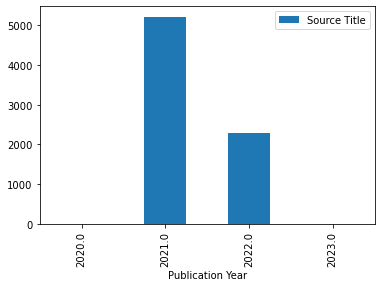

In [81]:
pt.plot(kind="bar")

In [105]:
import plotly.express as px
data=woindex.groupby(['Country/Region'])['Title'].count().reset_index(name='Values').sort_values(by= 'Values', ascending= False)
px.bar(x=data['Country/Region'] , y=data['Values']  , color=data['Values'],
      labels = { 'Country': 'Country/Region', 'Values': 'Values'})

In [131]:
data_region=article_df.groupby(['Category','Article Title' ])['Cited Reference Count'].count().reset_index(name='order').sort_values(by= 'order', ascending= False)
px.bar(data_region, x='Category', y='Article Title' , color='Category')

In [142]:
dt=article_df['WoS Categories']
dt.sample(4)

935     Computer Science, Artificial Intelligence; Com...
4962    Computer Science, Information Systems; Compute...
894                               Engineering, Biomedical
2646                    Clinical Neurology; Neurosciences
Name: WoS Categories, dtype: object

<Figure size 1080x1080 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

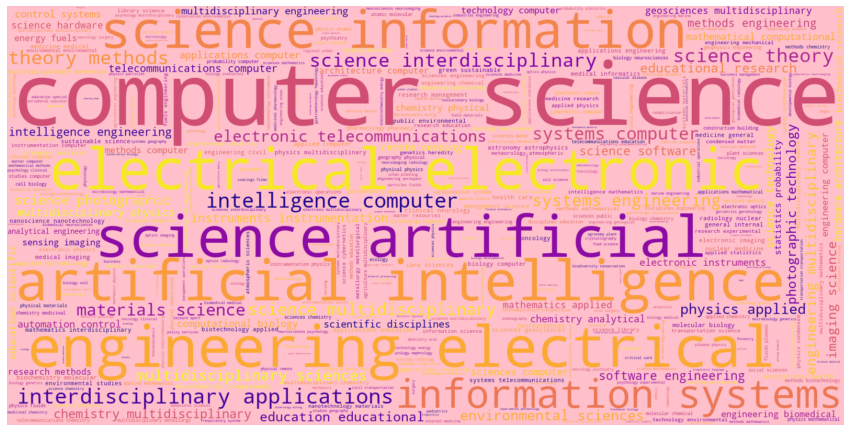

In [143]:
word_string=" ".join(dt.str.lower())
#Plot:
plt.figure(figsize=(15,15))
wc = WordCloud(background_color="pink", stopwords = STOPWORDS, max_words=2000, max_font_size= 300,  width=1600, height=800)
wc.generate(word_string)
plt.imshow(wc.recolor( colormap= 'plasma' , random_state=17), interpolation="bilinear")
plt.axis('off')

In [144]:
article_df['WoS Categories'].value_counts()

Computer Science, Artificial Intelligence                                                                                                                                                                                                 405
Computer Science, Information Systems; Engineering, Electrical & Electronic; Telecommunications                                                                                                                                           330
Multidisciplinary Sciences                                                                                                                                                                                                                303
Education & Educational Research                                                                                                                                                                                                          187
Chemistry, Analytical; Engineering, Electrical &

In [151]:
import nltk
nltk.download()
from nltk.tokenize import word_tokenize,sent_tokenize

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [161]:
pip install fancyimpute

  Using cached fancyimpute-0.7.0.tar.gz (25 kB)
  Using cached knnimpute-0.1.0.tar.gz (8.3 kB)
  Using cached cvxpy-1.2.1-cp39-cp39-win_amd64.whl (833 kB)
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29899 sha256=4ea4f12538b5ddb60e5973239c625ca7b475562dafe36f80b04994f17c0e3ebb
  Stored in directory: c:\users\nknav\appdata\local\pip\cache\wheels\f9\fc\6a\b0406b906bce293abe23c3b6da5a72637d2d04146ef1125a0b
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11353 sha256=d3aa082c6967e29a361fe6bcf8899592cf312fb946bbe53552aab84e95f229c8
  Stored in directory: c:\users\nknav\appdata\local\pip\cache\wheels\88\c4\be\e232c750d9bc360abf9a5e2cafe0d3e08e3605d2801bb11684
Successfully built fancyimpute knnimpute


  Using cached fancyimpute-0.7.0.tar.gz (25 kB)
  Using cached knnimpute-0.1.0.tar.gz (8.3 kB)
  Using cached cvxpy-1.2.1-cp39-cp39-win_amd64.whl (833 kB)
  Using cached osqp-0.6.2.post5-cp39-cp39-win_amd64.whl (278 kB)
  Using cached ecos-2.0.10-cp39-cp39-win_amd64.whl (68 kB)
  Using cached qdldl-0.1.5.post2-cp39-cp39-win_amd64.whl (83 kB)
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29899 sha256=87cea4f6ba9b9ddd97ffd65f2c126074bd0f514d74b59f8012d151429941e90b
  Stored in directory: c:\users\nknav\appdata\local\pip\cache\wheels\f9\fc\6a\b0406b906bce293abe23c3b6da5a72637d2d04146ef1125a0b
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11353 sha256=e1d9bbdd7cfb4ce53afe6d7183459901066d9abf4ce82211b9494dbbd49aee8a
  Stored in directory: c:\users\nknav\appdata\local\pip\cache\wheels\88\c4\be\e232c750d9bc360abf9a5e2cafe0d3e08e3605d2801bb11684
Successfully built fancyimpute knnimpute
Note: you may need to restart the kernel 

In [172]:
import numpy as np
from fancyimpute import KNN
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs


In [173]:
from sklearn.feature_extraction.text import CountVectorizer

In [174]:
count= CountVectorizer()

In [179]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

In [183]:
def mining(x):
    tokenized= sent_tokenize(x)
    bag_of_words=count.fit_transform(tokenized)
    return bag_of_words.toarray()

In [184]:
article_df['WoS Categories']=article_df['WoS Categories'].astype('str').apply(mining)

In [187]:
article_df['Source Title']=article_df['Source Title'].astype('str').apply(mining)

In [189]:
article_df['Article Title']=article_df['Article Title'].astype('str').apply(mining)

In [190]:
article_df['Document Type']=article_df['Document Type'].astype('str').apply(mining)

In [191]:
article_df['Authors']=article_df['Authors'].astype('str').apply(mining)

In [193]:
article_df['Publisher']=article_df['Publisher'].astype('str').apply(mining)

In [166]:
import re
def text_cleaner(text):
    rules = [
        {r'>\s+': u'>'},  # remove spaces after a tag opens or closes
        {r'\s+': u' '},  # replace consecutive spaces
        {r'\s*<br\s*/?>\s*': u'\n'},  # newline after a <br>
        {r'</(div)\s*>\s*': u'\n'},  # newline after </p> and </div> and <h1/>...
        {r'</(p|h\d)\s*>\s*': u'\n\n'},  # newline after </p> and </div> and <h1/>...
        {r'<head>.*<\s*(/head|body)[^>]*>': u''},  # remove <head> to </head>
        {r'<a\s+href="([^"]+)"[^>]*>.*</a>': r'\1'},  # show links instead of texts
        {r'[ \t]*<[^<]*?/?>': u''},  # remove remaining tags
        {r'^\s+': u''}  # remove spaces at the beginning
    ]
    for rule in rules:
        for (k, v) in rule.items():
            regex = re.compile(k) #compiles a regular expression pattern provided as a string into a regex pattern object
            text = regex.sub(v, text) # returns a string after replacing the matched pattern in a string with a replacement.
            text = text.rstrip() #removes any trailing characters (characters at the end a string)
    return text.lower() # get the unique format 

In [198]:
article_df.sample(5)

,Source Title,CiteScore,Highest percentile,2018-21 Citations,2018-21 Documents,% Cited,SNIP,SJR,Publisher,Category,Publication Type,Authors,Article Title,Document Type,Cited Reference Count,"Times Cited, WoS Core","Times Cited, All Databases",180 Day Usage Count,Since 2013 Usage Count,Publication Year,DOI,WoS Categories,UT (Unique WOS ID)
4029,"[[2, 1, 1, 1, 1, 1, 1, 1]]",20.8272,96.806094,65745.107011,None,87.392428,3.150257,3.699302,[[1]],Computer Science Applications,C,[[1]],"[[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 4]]","[[1, 1]]",8,0,0,1,1,2021.0,None,"[[1, 1, 2]]",WOS:000703105600024
7335,"[[1, 1]]",12.6000,96.000000,7810.000000,622.0,88.000000,2.341000,2.433000,"[[1, 1, 1]]",Psychiatry and Mental Health,J,"[[1, 1, 1, 1, 1, 1, 1, 1]]","[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...",[[1]],63,2,2,2,2,2021.0,10.1093/schbul/sbaa152,[[1]],WOS:000651837500025
407,"[[1, 1]]",20.1000,98.000000,21933.000000,1093.0,86.000000,3.518000,9.371000,"[[1, 1]]","Ecology, Evolution, Behavior and Systematics",J,"[[1, 1, 1, 1, 1, 1]]","[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]",[[1]],66,0,0,0,0,2022.0,10.1186/s13059-022-02683-1,"[[1, 1, 1, 1, 1]]",WOS:000805591300001
3801,"[[1, 1, 1, 1, 1]]",20.8272,96.806094,65745.107011,None,87.392428,3.150257,3.699302,[[1]],Computer Science Applications,J,"[[1, 1, 1, 1, 1, 1]]","[[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]]",[[1]],39,2,2,13,28,2021.0,10.1007/s11356-021-15125-5,"[[1, 1]]",WOS:000668855600009
2050,"[[1, 1, 1]]",20.8272,96.806094,65745.107011,None,87.392428,3.150257,3.699302,[[1]],Computer Science Applications,J,"[[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1]]","[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1]]",[[1]],16,1,1,5,16,2021.0,10.1016/j.mtcomm.2021.102220,"[[1, 1, 1]]",WOS:000683045500001
